In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt  
xlsx_file = "Empower.csv"
init_data = pd.read_csv(xlsx_file)
init_data

,SETTLEMENTDATE,REGIONID,TOTALDEMAND
0,2017-01-01 00:30:00.000,NSW1,7259.07000
1,2017-01-01 00:30:00.000,QLD1,6462.14000
2,2017-01-01 00:30:00.000,SA1,1395.21000
3,2017-01-01 00:30:00.000,TAS1,863.08000
4,2017-01-01 00:30:00.000,VIC1,4097.58000
...,...,...,...
481675,2022-07-01 00:00:00.000,NSW1,8731.47500
481676,2022-07-01 00:00:00.000,QLD1,5624.54500
481677,2022-07-01 00:00:00.000,SA1,1694.35000
481678,2022-07-01 00:00:00.000,TAS1,1134.75833


In [15]:
xlsx_file = "ElecMMS3_ROOFTOP_PV_ACTUAL_pivot.csv"
PV_pivot_data = pd.read_csv(xlsx_file)
# PV_pivot_data = PV_pivot_data.fillna(0)
print(str(PV_pivot_data['POWER_DAILY']))
print(type(init_data['SETTLEMENTDATE']))

init_data['added_PV_TOTALDEMAND'] = init_data['TOTALDEMAND']
for i in range(len(init_data)):
    if not pd.isna(PV_pivot_data['POWER_DAILY'][i]): 
        init_data['added_PV_TOTALDEMAND'][i] = PV_pivot_data['POWER_DAILY'][i] + init_data['TOTALDEMAND'][i]
    else:
        if pd.isna(PV_pivot_data['POWER_DAILY'][i]) and not pd.isna(PV_pivot_data['POWER_MEASUREMENT'][i]):
            init_data['added_PV_TOTALDEMAND'][i] = PV_pivot_data['POWER_MEASUREMENT'][i] + init_data['TOTALDEMAND'][i]
PV_pivot_data


0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
481675    NaN
481676    NaN
481677    NaN
481678    NaN
481679    NaN
Name: POWER_DAILY, Length: 481680, dtype: float64
<class 'pandas.core.series.Series'>


<ipython-input-15-e79c58621987>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  init_data['added_PV_TOTALDEMAND'][i] = PV_pivot_data['POWER_DAILY'][i] + init_data['TOTALDEMAND'][i]
<ipython-input-15-e79c58621987>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  init_data['added_PV_TOTALDEMAND'][i] = PV_pivot_data['POWER_MEASUREMENT'][i] + init_data['TOTALDEMAND'][i]


,INTERVAL_DATETIME,REGIONID,POWER_DAILY,QI_DAILY,POWER_MEASUREMENT,QI_MEASUREMENT,POWER_SATELLITE,QI_SATELLITE
0,2017-01-01 00:30:00,NSW1,0.0,1.0,NaN,NaN,NaN,NaN
1,2017-01-01 00:30:00,QLD1,0.0,1.0,NaN,NaN,NaN,NaN
2,2017-01-01 00:30:00,SA1,0.0,1.0,NaN,NaN,NaN,NaN
3,2017-01-01 00:30:00,TAS1,0.0,1.0,NaN,NaN,NaN,NaN
4,2017-01-01 00:30:00,VIC1,0.0,1.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
481675,2022-07-01 00:00:00,NSW1,NaN,NaN,0.0,1.0,0.0,0.6
481676,2022-07-01 00:00:00,QLD1,NaN,NaN,0.0,1.0,0.0,0.6
481677,2022-07-01 00:00:00,SA1,NaN,NaN,0.0,1.0,0.0,0.6
481678,2022-07-01 00:00:00,TAS1,NaN,NaN,0.0,1.0,0.0,0.6


In [16]:
init_data

,SETTLEMENTDATE,REGIONID,TOTALDEMAND,added_PV_TOTALDEMAND
0,2017-01-01 00:30:00.000,NSW1,7259.07000,7259.07000
1,2017-01-01 00:30:00.000,QLD1,6462.14000,6462.14000
2,2017-01-01 00:30:00.000,SA1,1395.21000,1395.21000
3,2017-01-01 00:30:00.000,TAS1,863.08000,863.08000
4,2017-01-01 00:30:00.000,VIC1,4097.58000,4097.58000
...,...,...,...,...
481675,2022-07-01 00:00:00.000,NSW1,8731.47500,8731.47500
481676,2022-07-01 00:00:00.000,QLD1,5624.54500,5624.54500
481677,2022-07-01 00:00:00.000,SA1,1694.35000,1694.35000
481678,2022-07-01 00:00:00.000,TAS1,1134.75833,1134.75833


In [17]:
NSW_data = init_data[init_data.REGIONID == 'NSW1'].reset_index()
QLD_data = init_data[init_data.REGIONID == 'QLD1'].reset_index()
SA_data = init_data[init_data.REGIONID == 'SA1'].reset_index()
TAS_data = init_data[init_data.REGIONID == 'TAS1'].reset_index()
VIC_data = init_data[init_data.REGIONID == 'VIC1'].reset_index()
df = NSW_data
NSW_data

,index,SETTLEMENTDATE,REGIONID,TOTALDEMAND,added_PV_TOTALDEMAND
0,0,2017-01-01 00:30:00.000,NSW1,7259.07000,7259.07000
1,5,2017-01-01 01:00:00.000,NSW1,7046.41000,7046.41000
2,10,2017-01-01 01:30:00.000,NSW1,6845.24000,6845.24000
3,15,2017-01-01 02:00:00.000,NSW1,6629.92000,6629.92000
4,20,2017-01-01 02:30:00.000,NSW1,6472.71000,6472.71000
...,...,...,...,...,...
96331,481655,2022-06-30 22:00:00.000,NSW1,9629.76833,9629.76833
96332,481660,2022-06-30 22:30:00.000,NSW1,9513.61833,9513.61833
96333,481665,2022-06-30 23:00:00.000,NSW1,9192.70167,9192.70167
96334,481670,2022-06-30 23:30:00.000,NSW1,8971.18667,8971.18667


In [18]:
NSW_data['date'] = pd.to_datetime(df['SETTLEMENTDATE'], format="%Y-%m-%d %H:%M:%S.%f")

In [19]:
data = pd.DataFrame(NSW_data.added_PV_TOTALDEMAND.copy())
data.columns = ["y"]

In [20]:
# data.index = data.index.to_datetime()
data["hour"] = df.date.dt.hour
data["weekday"] = df.date.dt.weekday
data['is_weekend'] = data.weekday.isin([5,6])*1


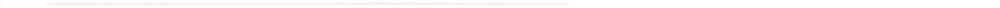

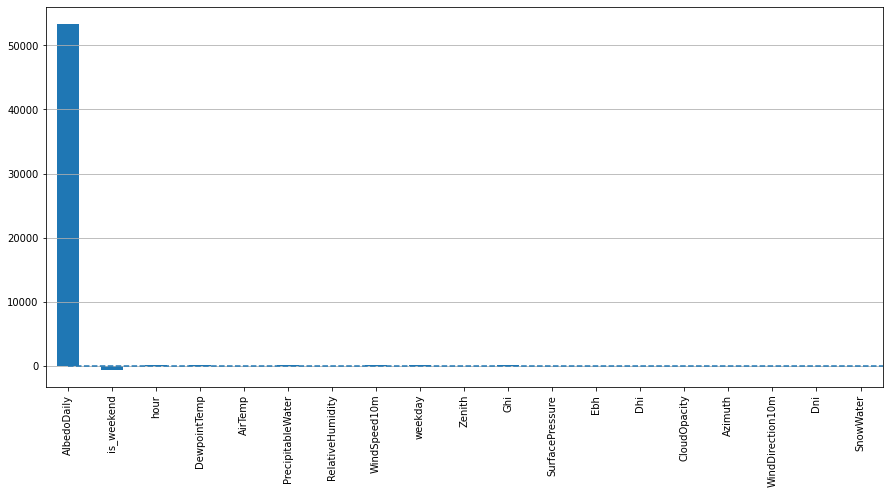

In [47]:
#GREEN: Prediction
#Bule:  Actual
from sklearn.model_selection import TimeSeriesSplit
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import r2_score, median_absolute_error, mean_absolute_error
from sklearn.metrics import median_absolute_error, mean_squared_error, mean_squared_log_error

# for time-series cross-validation set 5 folds 
tscv = TimeSeriesSplit(n_splits=5)

from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

y = data.dropna().y
X = data.dropna().drop(['y'], axis=1)
X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)


def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100


def timeseries_train_test_split(X, y, test_size):
    """
        Perform train-test split with respect to time series structure
    """
    
    # get the index after which test set starts
    test_index = int(len(X)*(1-test_size))
    
    X_train = X.iloc[:test_index]
    y_train = y.iloc[:test_index]
    X_test = X.iloc[test_index:]
    y_test = y.iloc[test_index:]
    
    return X_train, X_test, y_train, y_test

def plotModelResults(model, X_train=X_train, X_test=X_test, plot_intervals=False, plot_anomalies=False, scale=19.6):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """
    
    prediction = model.predict(X_test)
    
    plt.figure(figsize=(800, 7))
    plt.plot(prediction, "g", label="prediction", linewidth=2.0)
    plt.plot(y_test.values, label="actual", linewidth=2.0)
    
    if plot_intervals:
        cv = cross_val_score(model, X_train, y_train, 
                                    cv=tscv, 
                                    scoring="neg_mean_squared_error")
        #mae = cv.mean() * (-1)
        deviation = np.sqrt(cv.std())
        
        lower = prediction - (scale * deviation)
        upper = prediction + (scale * deviation)
        
        plt.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        plt.plot(upper, "r--", alpha=0.5)
        
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            plt.plot(anomalies, "o", markersize=10, label = "Anomalies")
    
    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True);
    
def plotCoefficients(model):
    """
        Plots sorted coefficient values of the model
    """
    
    coefs = pd.DataFrame(model.coef_, X_train.columns)
    coefs.columns = ["coef"]
    coefs["abs"] = coefs.coef.apply(np.abs)
    coefs = coefs.sort_values(by="abs", ascending=False).drop(["abs"], axis=1)
    
    plt.figure(figsize=(15, 7))
    coefs.coef.plot(kind='bar')
    plt.grid(True, axis='y')
    plt.hlines(y=0, xmin=0, xmax=len(coefs), linestyles='dashed');
    
    
y = data.dropna().y
X = data.dropna().drop(['y'], axis=1)

# reserve 30% of data for testing


# machine learning in two lines
lr = LinearRegression()
lr.fit(X_train, y_train)

plotModelResults(lr, plot_intervals=True)
plotCoefficients(lr)

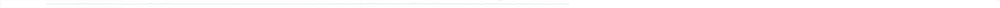

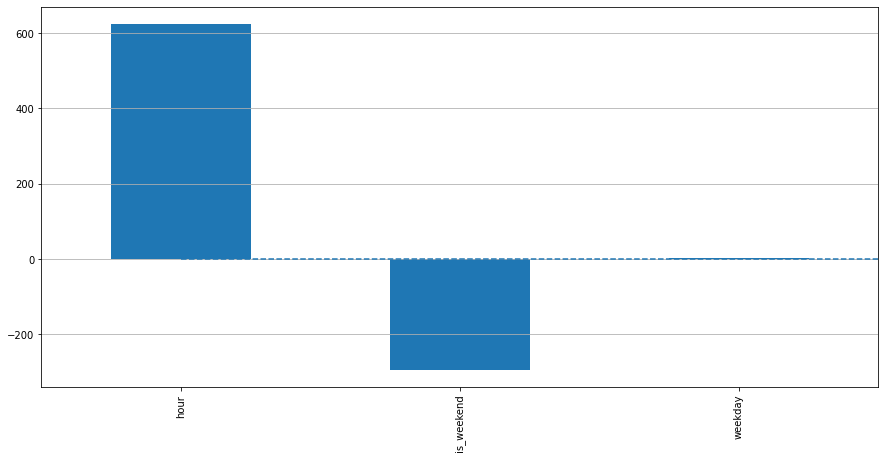

In [27]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

y = data.dropna().y
X = data.dropna().drop(['y'], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True)
plotCoefficients(lr)

In [28]:
xlsx_file = "-33.86882_151.209295_Solcast_PT30M.csv"
weather_data = pd.read_csv(xlsx_file)
weather_data['PeriodStart'][0]

'2016-12-31T01:00:00Z'

In [29]:
weather_data['date'] = pd.to_datetime(weather_data['PeriodEnd'], format="%Y-%m-%dT%H:%M:%SZ")
weather_data

,PeriodEnd,PeriodStart,Period,AirTemp,Azimuth,CloudOpacity,DewpointTemp,Dhi,Dni,Ebh,Ghi,PrecipitableWater,RelativeHumidity,SnowWater,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,AlbedoDaily,date
0,2016-12-31T01:30:00Z,2016-12-31T01:00:00Z,PT30M,26.4,-43,1.8,20.6,187,848,821,1009,40.4,70.5,0,990.6,144,4.2,14,0.08,2016-12-31 01:30:00
1,2016-12-31T02:00:00Z,2016-12-31T01:30:00Z,PT30M,26.4,-15,11.2,20.6,376,560,549,925,40.1,70.6,0,990.5,141,4.1,11,0.08,2016-12-31 02:00:00
2,2016-12-31T02:30:00Z,2016-12-31T02:00:00Z,PT30M,26.3,20,25.8,20.6,572,203,199,771,39.7,70.7,0,990.4,138,4.0,12,0.08,2016-12-31 02:30:00
3,2016-12-31T03:00:00Z,2016-12-31T02:30:00Z,PT30M,26.3,47,37.7,20.6,620,16,16,636,39.3,70.8,0,990.3,135,3.9,15,0.08,2016-12-31 03:00:00
4,2016-12-31T03:30:00Z,2016-12-31T03:00:00Z,PT30M,26.3,62,36.2,20.6,621,10,9,630,38.8,70.8,0,990.2,131,3.9,20,0.08,2016-12-31 03:30:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98584,2022-08-15T21:30:00Z,2022-08-15T21:00:00Z,PT30M,10.5,-67,0.0,5.6,28,449,57,86,15.8,71.5,0,1005.2,289,3.9,83,0.12,2022-08-15 21:30:00
98585,2022-08-15T22:00:00Z,2022-08-15T21:30:00Z,PT30M,11.2,-63,0.0,5.6,41,622,137,178,15.7,68.5,0,1005.3,288,3.9,77,0.12,2022-08-15 22:00:00
98586,2022-08-15T22:30:00Z,2022-08-15T22:00:00Z,PT30M,12.0,-58,0.0,5.5,48,722,225,273,15.5,64.6,0,1005.4,285,4.1,72,0.12,2022-08-15 22:30:00
98587,2022-08-15T23:00:00Z,2022-08-15T22:30:00Z,PT30M,12.9,-52,0.0,5.3,53,789,311,364,15.2,60.0,0,1005.4,281,4.4,67,0.12,2022-08-15 23:00:00


In [30]:
from datetime import timedelta
weather_data['date'] = weather_data['date'] + timedelta(hours=10)
weather_data

,PeriodEnd,PeriodStart,Period,AirTemp,Azimuth,CloudOpacity,DewpointTemp,Dhi,Dni,Ebh,Ghi,PrecipitableWater,RelativeHumidity,SnowWater,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,AlbedoDaily,date
0,2016-12-31T01:30:00Z,2016-12-31T01:00:00Z,PT30M,26.4,-43,1.8,20.6,187,848,821,1009,40.4,70.5,0,990.6,144,4.2,14,0.08,2016-12-31 11:30:00
1,2016-12-31T02:00:00Z,2016-12-31T01:30:00Z,PT30M,26.4,-15,11.2,20.6,376,560,549,925,40.1,70.6,0,990.5,141,4.1,11,0.08,2016-12-31 12:00:00
2,2016-12-31T02:30:00Z,2016-12-31T02:00:00Z,PT30M,26.3,20,25.8,20.6,572,203,199,771,39.7,70.7,0,990.4,138,4.0,12,0.08,2016-12-31 12:30:00
3,2016-12-31T03:00:00Z,2016-12-31T02:30:00Z,PT30M,26.3,47,37.7,20.6,620,16,16,636,39.3,70.8,0,990.3,135,3.9,15,0.08,2016-12-31 13:00:00
4,2016-12-31T03:30:00Z,2016-12-31T03:00:00Z,PT30M,26.3,62,36.2,20.6,621,10,9,630,38.8,70.8,0,990.2,131,3.9,20,0.08,2016-12-31 13:30:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98584,2022-08-15T21:30:00Z,2022-08-15T21:00:00Z,PT30M,10.5,-67,0.0,5.6,28,449,57,86,15.8,71.5,0,1005.2,289,3.9,83,0.12,2022-08-16 07:30:00
98585,2022-08-15T22:00:00Z,2022-08-15T21:30:00Z,PT30M,11.2,-63,0.0,5.6,41,622,137,178,15.7,68.5,0,1005.3,288,3.9,77,0.12,2022-08-16 08:00:00
98586,2022-08-15T22:30:00Z,2022-08-15T22:00:00Z,PT30M,12.0,-58,0.0,5.5,48,722,225,273,15.5,64.6,0,1005.4,285,4.1,72,0.12,2022-08-16 08:30:00
98587,2022-08-15T23:00:00Z,2022-08-15T22:30:00Z,PT30M,12.9,-52,0.0,5.3,53,789,311,364,15.2,60.0,0,1005.4,281,4.4,67,0.12,2022-08-16 09:00:00


In [31]:
new_weather = weather_data.loc[weather_data['date']>='2017-01-01 01:00:00']
new_weather = new_weather.loc[new_weather['date']<='2022-07-01 00:00:00']

In [32]:
new_weather

,PeriodEnd,PeriodStart,Period,AirTemp,Azimuth,CloudOpacity,DewpointTemp,Dhi,Dni,Ebh,Ghi,PrecipitableWater,RelativeHumidity,SnowWater,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,AlbedoDaily,date
27,2016-12-31T15:00:00Z,2016-12-31T14:30:00Z,PT30M,20.2,-167,0.0,19.2,0,0,0,0,38.0,94.3,0,992.5,131,2.6,122,0.09,2017-01-01 01:00:00
28,2016-12-31T15:30:00Z,2016-12-31T15:00:00Z,PT30M,20.0,-159,0.0,19.1,0,0,0,0,38.1,94.5,0,992.4,130,2.5,120,0.09,2017-01-01 01:30:00
29,2016-12-31T16:00:00Z,2016-12-31T15:30:00Z,PT30M,20.0,-152,0.0,19.1,0,0,0,0,38.1,94.5,0,992.4,128,2.3,118,0.09,2017-01-01 02:00:00
30,2016-12-31T16:30:00Z,2016-12-31T16:00:00Z,PT30M,20.0,-145,0.0,19.1,0,0,0,0,38.2,94.5,0,992.4,126,2.2,114,0.09,2017-01-01 02:30:00
31,2016-12-31T17:00:00Z,2016-12-31T16:30:00Z,PT30M,20.0,-139,0.0,19.1,0,0,0,0,38.3,94.5,0,992.3,123,2.0,110,0.09,2017-01-01 03:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96357,2022-06-30T12:00:00Z,2022-06-30T11:30:00Z,PT30M,14.8,101,73.2,8.9,0,0,0,0,21.7,67.5,0,1019.9,179,3.6,149,0.11,2022-06-30 22:00:00
96358,2022-06-30T12:30:00Z,2022-06-30T12:00:00Z,PT30M,14.6,109,72.2,9.1,0,0,0,0,22.0,69.6,0,1019.9,183,3.4,155,0.11,2022-06-30 22:30:00
96359,2022-06-30T13:00:00Z,2022-06-30T12:30:00Z,PT30M,14.4,119,68.6,9.3,0,0,0,0,22.1,71.5,0,1019.9,185,3.2,161,0.11,2022-06-30 23:00:00
96360,2022-06-30T13:30:00Z,2022-06-30T13:00:00Z,PT30M,14.2,136,60.0,9.5,0,0,0,0,22.2,73.5,0,1019.9,188,3.0,166,0.11,2022-06-30 23:30:00


In [33]:
new = pd.concat([new_weather,df],axis=0)

In [34]:
new_merge = df.merge(new_weather,on=['date'])
# new_merge = new_merge.rename(columns={'TOTALDEMAND':'y'})
new_merge = new_merge.reset_index()

In [35]:
data

,y,hour,weekday,is_weekend
0,7259.07000,0,6,1
1,7046.41000,1,6,1
2,6845.24000,1,6,1
3,6629.92000,2,6,1
4,6472.71000,2,6,1
...,...,...,...,...
96331,9629.76833,22,3,0
96332,9513.61833,22,3,0
96333,9192.70167,23,3,0
96334,8971.18667,23,3,0


In [36]:
df_col = pd.concat([new_merge,data], axis=1)

In [37]:
train_data = df_col.drop(columns=['level_0','index','SETTLEMENTDATE','REGIONID','TOTALDEMAND','added_PV_TOTALDEMAND','date','PeriodEnd','PeriodStart','Period'])
train_data

,AirTemp,Azimuth,CloudOpacity,DewpointTemp,Dhi,Dni,Ebh,Ghi,PrecipitableWater,RelativeHumidity,SnowWater,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,AlbedoDaily,y,hour,weekday,is_weekend
0,20.2,-167.0,0.0,19.2,0.0,0.0,0.0,0.0,38.0,94.3,0.0,992.5,131.0,2.6,122.0,0.09,7259.07000,0,6,1
1,20.0,-159.0,0.0,19.1,0.0,0.0,0.0,0.0,38.1,94.5,0.0,992.4,130.0,2.5,120.0,0.09,7046.41000,1,6,1
2,20.0,-152.0,0.0,19.1,0.0,0.0,0.0,0.0,38.1,94.5,0.0,992.4,128.0,2.3,118.0,0.09,6845.24000,1,6,1
3,20.0,-145.0,0.0,19.1,0.0,0.0,0.0,0.0,38.2,94.5,0.0,992.4,126.0,2.2,114.0,0.09,6629.92000,2,6,1
4,20.0,-139.0,0.0,19.1,0.0,0.0,0.0,0.0,38.3,94.5,0.0,992.3,123.0,2.0,110.0,0.09,6472.71000,2,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96331,14.6,109.0,72.2,9.1,0.0,0.0,0.0,0.0,22.0,69.6,0.0,1019.9,183.0,3.4,155.0,0.11,9629.76833,22,3,0
96332,14.4,119.0,68.6,9.3,0.0,0.0,0.0,0.0,22.1,71.5,0.0,1019.9,185.0,3.2,161.0,0.11,9513.61833,22,3,0
96333,14.2,136.0,60.0,9.5,0.0,0.0,0.0,0.0,22.2,73.5,0.0,1019.9,188.0,3.0,166.0,0.11,9192.70167,23,3,0
96334,13.9,165.0,57.0,9.7,0.0,0.0,0.0,0.0,22.4,75.7,0.0,1019.8,192.0,2.9,169.0,0.11,8971.18667,23,3,0


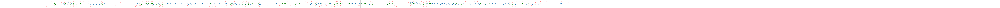

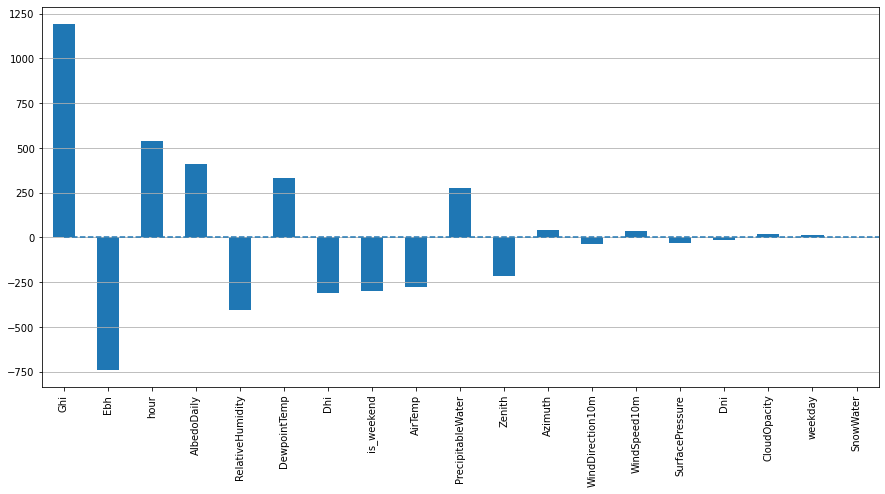

In [63]:
data = train_data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

y = data.dropna().y
X = data.dropna().drop(['y'], axis=1)

X_train, X_test, y_train, y_test = timeseries_train_test_split(X, y, test_size=0.3)

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
# y_train_scaled = scaler.fit_transform(y_train)
# y_test_scaled = scaler.transform(y_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

plotModelResults(lr, X_train=X_train_scaled, X_test=X_test_scaled, plot_intervals=True)
plotCoefficients(lr)

In [44]:
X_train

,AirTemp,Azimuth,CloudOpacity,DewpointTemp,Dhi,Dni,Ebh,Ghi,PrecipitableWater,RelativeHumidity,SnowWater,SurfacePressure,WindDirection10m,WindSpeed10m,Zenith,AlbedoDaily,hour,weekday,is_weekend
0,20.2,-167.0,0.0,19.2,0.0,0.0,0.0,0.0,38.0,94.3,0.0,992.5,131.0,2.6,122.0,0.09,0,6,1
1,20.0,-159.0,0.0,19.1,0.0,0.0,0.0,0.0,38.1,94.5,0.0,992.4,130.0,2.5,120.0,0.09,1,6,1
2,20.0,-152.0,0.0,19.1,0.0,0.0,0.0,0.0,38.1,94.5,0.0,992.4,128.0,2.3,118.0,0.09,1,6,1
3,20.0,-145.0,0.0,19.1,0.0,0.0,0.0,0.0,38.2,94.5,0.0,992.4,126.0,2.2,114.0,0.09,2,6,1
4,20.0,-139.0,0.0,19.1,0.0,0.0,0.0,0.0,38.3,94.5,0.0,992.3,123.0,2.0,110.0,0.09,2,6,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
67429,13.9,117.0,80.6,11.1,0.0,0.0,0.0,0.0,25.3,83.3,0.0,1008.8,217.0,8.3,100.0,0.09,19,3,0
67430,13.9,122.0,69.0,11.7,0.0,0.0,0.0,0.0,26.1,86.6,0.0,1008.9,209.0,9.1,106.0,0.09,19,3,0
67431,14.3,127.0,78.6,12.0,0.0,0.0,0.0,0.0,26.1,86.2,0.0,1009.2,197.0,9.9,111.0,0.09,20,3,0
67432,15.0,133.0,77.3,12.0,0.0,0.0,0.0,0.0,25.4,82.5,0.0,1009.6,184.0,10.8,116.0,0.09,20,3,0


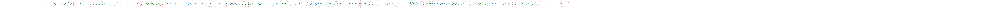

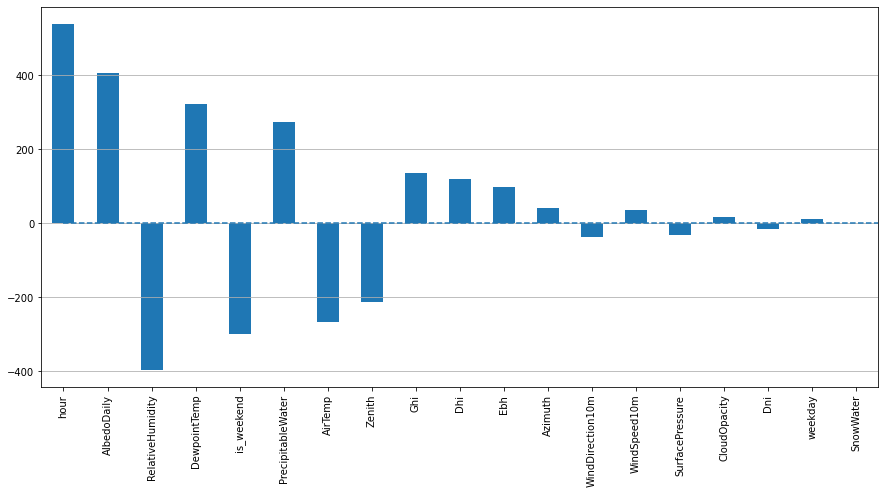

In [69]:
from sklearn.linear_model import LassoCV, RidgeCV

ridge = RidgeCV(cv=tscv)
ridge.fit(X_train_scaled, y_train)

plotModelResults(ridge, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 plot_intervals=True)
plotCoefficients(ridge)

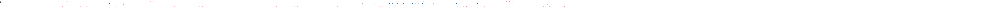

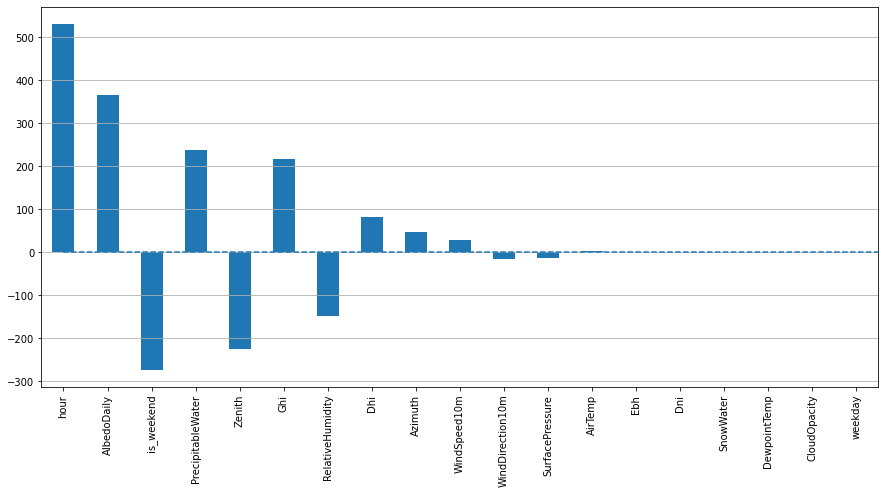

In [40]:
lasso = LassoCV(cv=tscv)
lasso.fit(X_train_scaled, y_train)

plotModelResults(lasso, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 plot_intervals=True)
plotCoefficients(lasso)

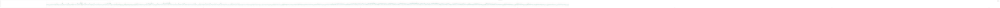

In [77]:
from xgboost import XGBRegressor 

xgb = XGBRegressor(objective='reg:squarederror', n_estimators=600)
xgb.fit(X_train_scaled, y_train)
testpred = xgb.predict(X_test)
plotModelResults(xgb, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 plot_intervals=True,plot_anomalies=True)


In [61]:
import math
from math import sqrt
test_mse = mean_squared_error(y_test, testpred)
rmse = sqrt(test_mse)
print('RMSE: %f' % rmse)
r_squared= xgb.score(X_test, y_test)
print(r_squared)
np.mean(y_test)

RMSE: 3840.112437
-7.65171280088898


8155.204185405003

In [72]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
parameters={'n_estimators':range(10, 300, 10),
            'max_depth':range(2,10,1),
            'learning_rate': [0.001, 0.005, 0.01, 0.05, 0.1, 0.2, 0.3],
            'min_child_weight':range(5, 21, 1),
            'subsample':[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
            'gamma':[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1],
            'colsample_bytree':[0.5, 0.6, 0.7, 0.8, 0.9, 1],
            'colsample_bylevel':[0.5, 0.6, 0.7, 0.8, 0.9, 1]
            }
#parameters={'max_depth':range(2,10,1)}
model=XGBRegressor(
                     n_estimators=100,
                     max_depth=3,
                     eval_metric='rmse',
                     learning_rate=0.1,
                     min_child_weight=1,
                     subsample=1,
                     colsample_bytree=1,
                     colsample_bylevel=1,
                     gamma=0)
gs=RandomizedSearchCV(estimator= model,param_grid=parameters,cv=5,refit= True,scoring='neg_mean_squared_error')

gs.fit(X_train_scaled,y_train)
print('最优参数: ', gs.best_params_)

est_scaled = gs.predict(X_train_scaled)
train['est'] = est_scaled * math.sqrt(scaler.var_[0]) + scaler.mean_[0]

pre_y_scaled = gs.predict(X_sample_scaled)
test['pre_y_scaled'] = pre_y_scaled
test['pre_y']=test['pre_y_scaled'] * test['adj_close_std'] + test['adj_close_mean']

TypeError: __init__() got an unexpected keyword argument 'param_grid'

In [76]:
cv_params = {'n_estimators': [400, 500, 600, 700, 800]}
other_params = {'learning_rate': 0.1, 'n_estimators': 500, 'max_depth': 5, 'min_child_weight': 1, 'seed': 0,
                'subsample': 0.8, 'colsample_bytree': 0.8, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 1}

model = XGBRegressor(**other_params)
optimized_GBM = GridSearchCV(estimator=model, param_grid=cv_params, scoring='r2', cv=5, verbose=1, n_jobs=4)
optimized_GBM.fit(X_train_scaled, y_train)
evalute_result = optimized_GBM.cv_results_
print('每轮迭代运行结果:{0}'.format(evalute_result))
print('参数的最佳取值：{0}'.format(optimized_GBM.best_params_))
print('最佳模型得分:{0}'.format(optimized_GBM.best_score_))

Fitting 5 folds for each of 5 candidates, totalling 25 fits
每轮迭代运行结果:{'mean_fit_time': array([15.80378537, 21.26699843, 26.31399937, 30.86639738, 31.1896049 ]), 'std_fit_time': array([0.56679576, 0.1493339 , 0.27719161, 0.07871371, 6.55779532]), 'mean_score_time': array([0.03480096, 0.04559946, 0.04859972, 0.05560026, 0.05099297]), 'std_score_time': array([0.00923931, 0.00739103, 0.00135652, 0.00080018, 0.01402407]), 'param_n_estimators': masked_array(data=[400, 500, 600, 700, 800],
             mask=[False, False, False, False, False],
       fill_value='?',
            dtype=object), 'params': [{'n_estimators': 400}, {'n_estimators': 500}, {'n_estimators': 600}, {'n_estimators': 700}, {'n_estimators': 800}], 'split0_test_score': array([0.93024699, 0.93155988, 0.9323059 , 0.9327081 , 0.93250055]), 'split1_test_score': array([0.92077719, 0.92222348, 0.92285044, 0.92324847, 0.92363821]), 'split2_test_score': array([0.9222027 , 0.92235092, 0.92251933, 0.92288257, 0.92315991]), 'split3_te

In [ ]:
cv_params = {'max_depth': [3, 4, 5, 6, 7, 8, 9, 10], 'min_child_weight': [1, 2, 3, 4, 5, 6]}
other_params = {'learning_rate': 0.1, 'n_estimators': 800, 'max_depth': 5, 'min_child_weight': 1, 'seed': 0,
                    'subsample': 0.8, 'colsample_bytree': 0.8, 'gamma': 0, 'reg_alpha': 0, 'reg_lambda': 1}
model = XGBRegressor(**other_params)
optimized_GBM = GridSearchCV(estimator=model, param_grid=cv_params, scoring='r2', cv=5, verbose=1, n_jobs=4)
optimized_GBM.fit(X_train_scaled, y_train)
evalute_result = optimized_GBM.cv_results_
print('每轮迭代运行结果:{0}'.format(evalute_result))
print('参数的最佳取值：{0}'.format(optimized_GBM.best_params_))
print('最佳模型得分:{0}'.format(optimized_GBM.best_score_))

Fitting 5 folds for each of 48 candidates, totalling 240 fits
